In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# All Installations

In [2]:
!pip install rasterio






     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 39.0 MB/s eta 0:00:00


# All Imports

In [41]:
import rasterio
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from scipy.signal import find_peaks
from sklearn.cluster import KMeans
import seaborn as sns
import pandas as pd


Image Shape: (13, 2797, 3909)
Number of Bands: 13
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


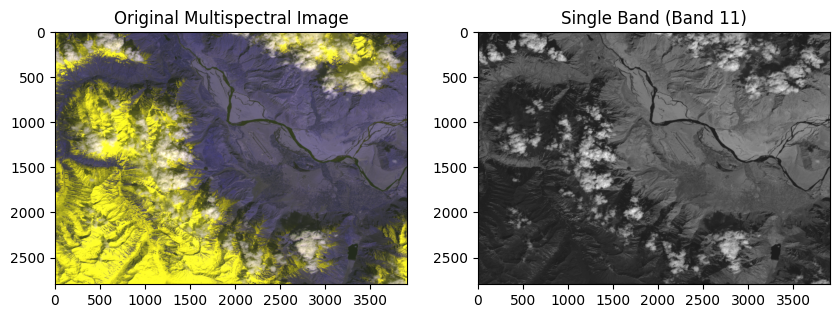

In [5]:
def read_image(image_path):
    """
    Read and visualize a multispectral image.

    Parameters:
    - image_path (str): Path to the multispectral image.
    """
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Number of Bands: {src.count}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Choose specific bands for RGB visualization
        rgb_bands = bands[[3, 2, 11], :, :]

        # Normalize the data for displaying RGB image
        rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

        # Display the original multispectral image
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(rgb_image)
        ax[0].set_title('Original Multispectral Image')

        # Save the RGB image
        cv2.imwrite('rgb_image.png', (rgb_image * 255).astype(np.uint8))

        # Display a single-band image as a sample
        ax[1].imshow(bands[11], cmap='gray')  # Display the first band as a sample
        ax[1].set_title('Single Band (Band 11)')

        plt.show()

    except rasterio.errors.RasterioIOError as e:
        print(f"Error opening raster image: {e}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Read and visualize the 13-band image
read_image(image_path_13bands)


In [6]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

def visualize_band(band_data, band_index):
    """
    Visualize an individual band.

    Parameters:
    - band_data (numpy.ndarray): The data of the band.
    - band_index (int): Index of the band.
    """
    plt.figure(figsize=(8, 8))
    plt.imshow(band_data, cmap='gray')
    plt.title(f'Band {band_index + 1}')
    plt.show()

def analyze_band_characteristics(band_data, band_index):
    """
    Analyze characteristics of an individual band.

    Parameters:
    - band_data (numpy.ndarray): The data of the band.
    - band_index (int): Index of the band.
    """
    print(f"Band {band_index + 1} Characteristics:")
    print(f"Min Value: {np.min(band_data)}")
    print(f"Max Value: {np.max(band_data)}")
    print(f"Mean Value: {np.mean(band_data)}")
    print(f"Standard Deviation: {np.std(band_data)}")
    print()

def create_and_visualize_individual_bands(image_path):
    """
    Read and visualize individual bands of a multispectral image.

    Parameters:
    - image_path (str): Path to the multispectral image.
    """
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Number of Bands: {src.count}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Loop through each band
        for i in range(src.count):
            band_data = bands[i, :, :]
            visualize_band(band_data, i)
            analyze_band_characteristics(band_data, i)

    except rasterio.errors.RasterioIOError as e:
        print(f"Error opening raster image: {e}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Create and visualize individual bands
create_and_visualize_individual_bands(image_path_13bands)

Output hidden; open in https://colab.research.google.com to view.

Provided techniques is giving insights into the characteristics of different bands in your multispectral image, particularly focusing on Near-Infrared (NIR), Red, and Shortwave Infrared (SWIR) bands. Here's a breakdown:

1. **NIR Bands:**
   - Bands 8 and 5 capture Near-Infrared (NIR) information.
   - NIR bands are useful for vegetation health and land cover classification.
   - Bands 8 and 5 show relatively high mean values, indicating higher reflectance. This is beneficial for distinguishing between different types of surfaces.

2. **Red Bands:**
   - Band 4 is a Red band, also important for vegetation analysis.
   - Red bands, when used in conjunction with NIR bands, are crucial for calculating vegetation indices like NDVI.
   - Band 4 shows a relatively high mean value.

3. **SWIR Bands:**
   - Bands 11 and 12 are Shortwave Infrared (SWIR) bands.
   - SWIR bands provide information about surface composition and moisture content.
   - Bands 11 and 12 have relatively high mean values.

Considering these characteristics, a recommended combination for your deep learning framework could include bands 4 (Red), 5 (NIR), 8 (NIR), 11 (SWIR), and 12 (SWIR). This combination may provide a comprehensive set of spectral information for your classification task.

For applying NDVI, you can follow these steps:
1. Choose the Red (R) band (Band 4) and the NIR band (Band 8).
2. Use the NDVI formula: \(NDVI = \frac{(NIR - Red)}{(NIR + Red)}\).
3. Apply this formula to calculate NDVI for each pixel in the selected bands.
4. Visualize the NDVI image. Typically, vegetation appears in shades of green, while non-vegetated areas may appear in shades of brown or gray.

Implementing NDVI will help you identify and distinguish vegetation from other surfaces, which is valuable for land cover classification, including your classes like Snow, Non-Snow, Clouds, etc.

In [10]:
def visualize_band(band_data, band_index, title):
    plt.figure(figsize=(8, 8))
    plt.imshow(band_data, cmap='gray')
    plt.title(f'{title} Band {band_index + 1}')
    plt.show()

def find_red_nir_bands(image_path):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Number of Bands: {src.count}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Loop through each band and visualize
        for i in range(src.count):
            band_data = bands[i, :, :]
            visualize_band(band_data, i, 'Original')

        # Manually choose the bands for Red and NIR based on visualization
        red_band_index = int(input("Enter the index of the Red band: ")) - 1
        nir_band_index = int(input("Enter the index of the NIR band: ")) - 1

        # Visualize the chosen Red and NIR bands
        visualize_band(bands[red_band_index, :, :], red_band_index, 'Red')
        visualize_band(bands[nir_band_index, :, :], nir_band_index, 'NIR')

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Find Red and NIR bands for the 13-band image
find_red_nir_bands(image_path_13bands)


Output hidden; open in https://colab.research.google.com to view.

<ipython-input-12-7c1b888f9dab>:28: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir_band - red_band) / (nir_band + red_band)


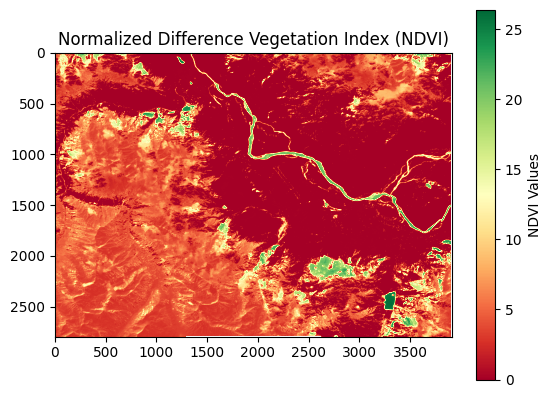

In [12]:
def read_image_and_calculate_ndvi(image_path, red_band_index, nir_band_index):
    """
    Read a multispectral image, calculate NDVI, and display the result.

    Parameters:
    - image_path (str): The file path of the multispectral image.
    - red_band_index (int): The index of the red band.
    - nir_band_index (int): The index of the near-infrared (NIR) band.

    Returns:
    None
    """
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Choose the red and NIR bands based on user input
        red_band = bands[red_band_index, :, :]
        nir_band = bands[nir_band_index, :, :]

        # Calculate NDVI
        ndvi = (nir_band - red_band) / (nir_band + red_band)

        # Display the NDVI image
        plt.imshow(ndvi, cmap='RdYlGn')
        plt.title('Normalized Difference Vegetation Index (NDVI)')
        plt.colorbar(label='NDVI Values')
        plt.show()

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Specify the bands for NDVI calculation based on user input
red_band_index_13bands = 4  # Replace with the actual index of the red band
nir_band_index_13bands = 8  # Replace with the actual index of the NIR band

# Read the 13-band image and calculate NDVI using specified bands
read_image_and_calculate_ndvi(image_path_13bands, red_band_index_13bands, nir_band_index_13bands)


<ipython-input-13-a1012207f57b>:12: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_band - nir_band) / (green_band + nir_band)


Image Shape: (13, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


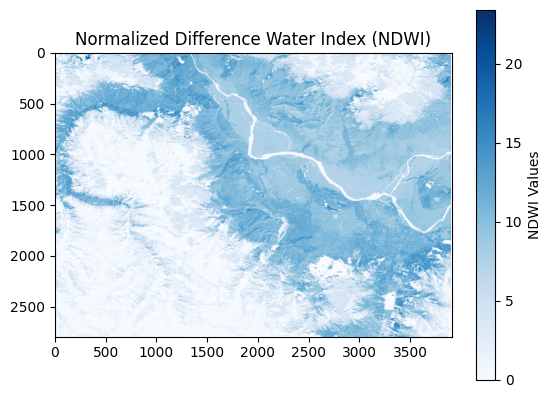

In [13]:
def calculate_ndwi(green_band, nir_band):
    """
    Calculate the Normalized Difference Water Index (NDWI) using green and NIR bands.

    Parameters:
    - green_band (numpy.ndarray): The green band data.
    - nir_band (numpy.ndarray): The near-infrared (NIR) band data.

    Returns:
    numpy.ndarray: The NDWI values.
    """
    ndwi = (green_band - nir_band) / (green_band + nir_band)
    return ndwi

try:
    # Open the multispectral image
    src = rasterio.open('/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif')

    # Read the multispectral bands
    bands = src.read()

    # Specify the bands for NDWI calculation based on your chosen bands
    green_band_index = 3  # Replace with the actual index of the green band
    nir_band_index = 8    # Replace with the actual index of the NIR band

    # Choose the green and NIR bands
    green_band = bands[green_band_index]
    nir_band = bands[nir_band_index]

    # Calculate NDWI
    ndwi = calculate_ndwi(green_band, nir_band)

    # Display metadata information
    print(f"Image Shape: {bands.shape}")
    print(f"Resolution: {src.res}")
    print(f"Coordinate Reference System (CRS): {src.crs}")

    # Display the NDWI image
    plt.imshow(ndwi, cmap='Blues')
    plt.title('Normalized Difference Water Index (NDWI)')
    plt.colorbar(label='NDWI Values')
    plt.show()

except Exception as e:
    print(f"Error: {e}")

finally:
    # Close the rasterio dataset
    if src:
        src.close()


Snow Detection:

NIR (Band 8): Snow reflects strongly in the Near-Infrared (NIR) region, making it distinguishable from other land cover types.
SWIR (Bands 11 and 12): Shortwave Infrared bands help in identifying snow due to its unique reflectance properties in these wavelengths.
Vegetation Detection:

Red (Band 4): Vegetation absorbs red light and reflects NIR, making the Red band useful for distinguishing healthy vegetation.
NIR (Band 8): Near-Infrared is highly reflective in healthy vegetation, aiding in vegetation detection and health assessment.
Water Detection:

Blue (Band 2): Water bodies absorb blue light, making the Blue band useful for identifying water features.
Green (Band 3): Green band complements the Blue band in water detection.
SWIR (Bands 11 and 12): Shortwave Infrared bands assist in detecting water content due to their interaction with water molecules.

Image Shape: (6, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


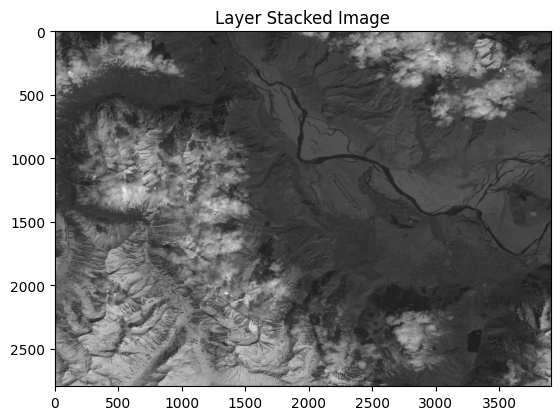

Stacked image saved at: /content/drive/MyDrive/SentinalTwoImage/stacked_image_04.png


In [16]:
def stack_layers(image_path, selected_bands, output_folder='/content/drive/MyDrive/SentinalTwoImage/'):
    """
    Stack selected bands from a multispectral image and save the result.

    Parameters:
    - image_path (str): The file path to the multispectral image.
    - selected_bands (list): A list of band indices to stack.
    - output_folder (str): The folder path to save the stacked image.

    Returns:
    - str: The file path where the stacked image is saved.
    """
    try:
        # Open the multispectral image
        with rasterio.open(image_path) as src:
            # Read selected bands
            bands = src.read(selected_bands)

            # Display metadata information
            print(f"Image Shape: {bands.shape}")
            print(f"Resolution: {src.res}")
            print(f"Coordinate Reference System (CRS): {src.crs}")

            # Stack the bands into a single channel image
            stacked_image = np.mean(bands, axis=0)

            # Save the stacked image
            stacked_image_path = f'{output_folder}stacked_image_04.png'
            plt.imsave(stacked_image_path, stacked_image, cmap='gray')

            # Display the stacked image
            plt.imshow(stacked_image, cmap='gray')
            plt.title('Layer Stacked Image')
            plt.show()

            return stacked_image_path

    except Exception as e:
        print(f"Error: {e}")
        return None

# Specify the image path and bands to stack
selected_bands_to_stack = [2, 3, 4, 8, 11, 12]
image_path_to_stack = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Perform layer stacking
stacked_image_path_result = stack_layers(image_path_to_stack, selected_bands_to_stack)

# Display the saved image path
if stacked_image_path_result:
    print(f'Stacked image saved at: {stacked_image_path_result}')
else:
    print('Error occurred during layer stacking.')


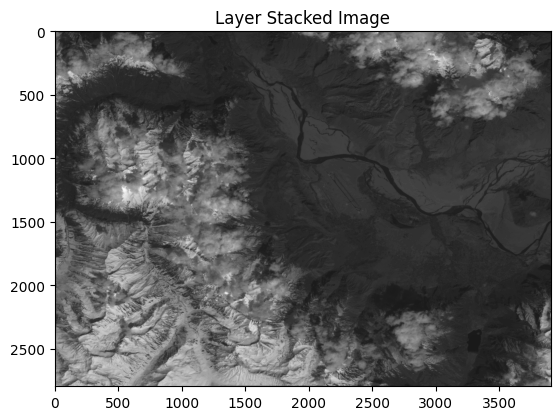

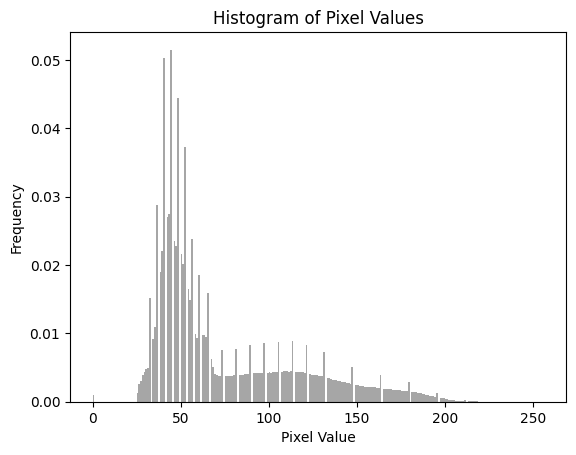

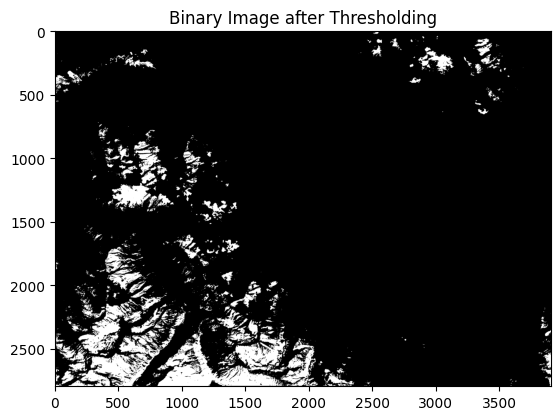

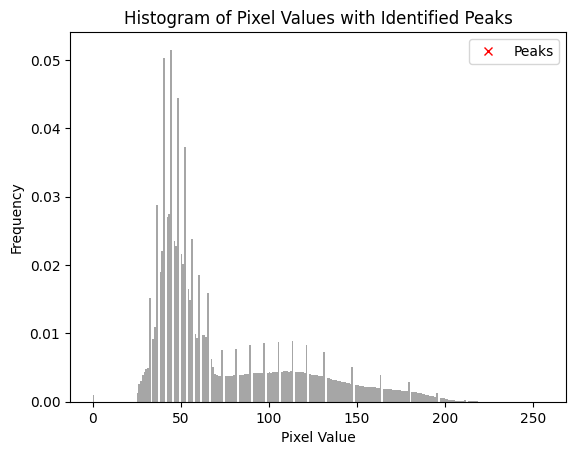

In [26]:
# image_analysis.py
from scipy.signal import find_peaks

def load_image(image_path):
    """
    Load an image from the specified path using OpenCV.

    Parameters:
    - image_path (str): The path to the image file.

    Returns:
    - np.ndarray: The loaded image as a NumPy array.
    """
    return cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

def display_image(image, title):
    """
    Display the input image using Matplotlib.

    Parameters:
    - image (np.ndarray): The image to be displayed.
    - title (str): The title for the displayed image.
    """
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.show()

def flatten_image(image):
    """
    Flatten the input image to a 1D array.

    Parameters:
    - image (np.ndarray): The input image.

    Returns:
    - np.ndarray: The flattened 1D array.
    """
    return image.flatten()

def plot_histogram(pixel_values):
    """
    Plot a histogram of pixel values.

    Parameters:
    - pixel_values (np.ndarray): The 1D array of pixel values.
    """
    plt.hist(pixel_values, bins=256, range=[0, 256], density=True, color='gray', alpha=0.7)
    plt.title('Histogram of Pixel Values')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

def apply_threshold(image, threshold_value):
    """
    Apply thresholding to the input image based on a specified value.

    Parameters:
    - image (np.ndarray): The input image.
    - threshold_value (int): The threshold value for binarization.

    Returns:
    - np.ndarray: The binary image after thresholding.
    """
    return (image > threshold_value).astype(np.uint8) * 255

def identify_peaks(pixel_values, peak_threshold):
    """
    Identify peaks in the histogram based on a specified threshold.

    Parameters:
    - pixel_values (np.ndarray): The 1D array of pixel values.
    - peak_threshold (float): The threshold for identifying peaks.

    Returns:
    - list: A list of indices corresponding to identified peaks.
    """
    histogram, bins = np.histogram(pixel_values, bins=256, range=[0, 256], density=True)
    peaks, _ = find_peaks(histogram, height=peak_threshold)
    return peaks

def plot_peaks(pixel_values, peaks):
    """
    Plot the histogram of pixel values with identified peaks.

    Parameters:
    - pixel_values (np.ndarray): The 1D array of pixel values.
    - peaks (list): A list of indices corresponding to identified peaks.
    """
    plt.hist(pixel_values, bins=256, range=[0, 256], density=True, color='gray', alpha=0.7)
    plt.title('Histogram of Pixel Values with Identified Peaks')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.plot(peaks, np.histogram(pixel_values, bins=256, range=[0, 256], density=True)[0][peaks], "x", color="red", label="Peaks")
    plt.legend()
    plt.show()


if __name__ == "__main__":
    # Specify the path to the stacked image
    stacked_image_path = "/content/drive/MyDrive/SentinalTwoImage/stacked_image.png"

    # Load the stacked image
    stacked_image = load_image(stacked_image_path)

    # Display the stacked image
    display_image(stacked_image, 'Layer Stacked Image')

    # Flatten the image to a 1D array
    pixel_values = flatten_image(stacked_image)

    # Plot the histogram of pixel values
    plot_histogram(pixel_values)

    # Example: Apply thresholding based on a specific value
    threshold_value = 150
    binary_image = apply_threshold(stacked_image, threshold_value)

    # Display the binary image after thresholding
    display_image(binary_image, 'Binary Image after Thresholding')

    # Specify the peak threshold for identification
    peak_threshold = 0.1

    # Identify peaks in the histogram
    identified_peaks = identify_peaks(pixel_values, peak_threshold)

    # Plot the histogram with identified peaks
    plot_peaks(pixel_values, identified_peaks)


Image Shape: (13, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


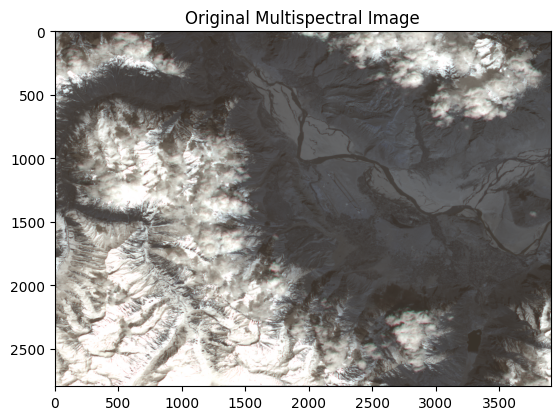

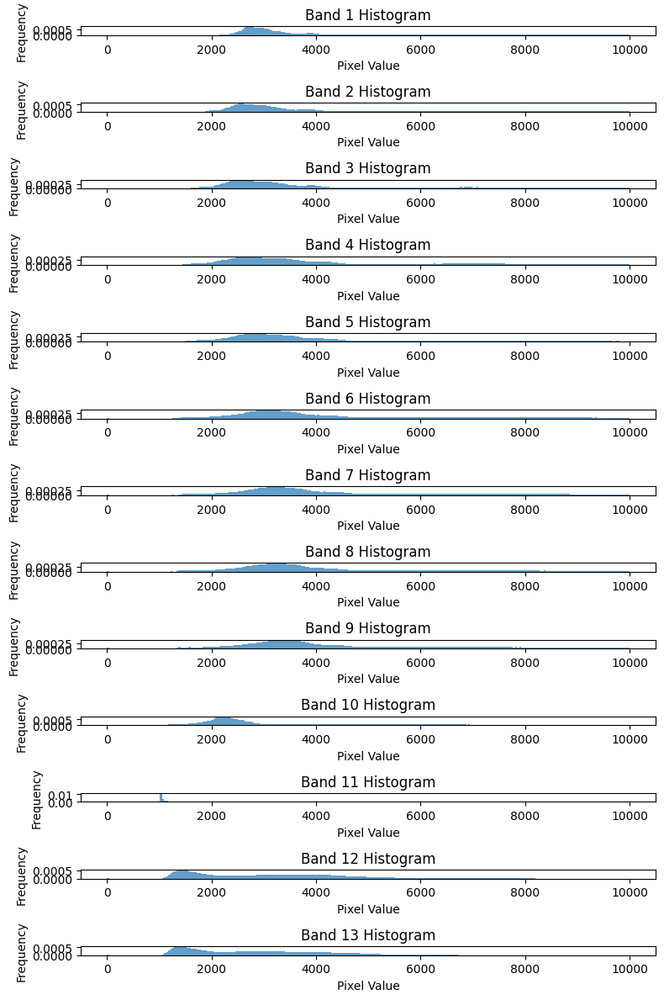

In [28]:
def display_metadata(image_path):
    """
    Display metadata information of the multispectral image.

    Parameters:
    - image_path (str): The path to the multispectral image.

    Returns:
    - numpy.ndarray: The bands of the multispectral image.
    """
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        return bands

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

def plot_original_multispectral_image(bands):
    """
    Plot the original multispectral image using the first three bands.

    Parameters:
    - bands (numpy.ndarray): The bands of the multispectral image.
    """
    # Normalize the data for displaying RGB image
    rgb_bands = (bands[:3, :, :].clip(0, 10000) / 10000).transpose(1, 2, 0)

    plt.imshow(rgb_bands)
    plt.title('Original Multispectral Image')
    plt.show()


def plot_histograms(bands):
    """
    Plot histograms for each band of the multispectral image.

    Parameters:
    - bands (numpy.ndarray): The bands of the multispectral image.
    """
    # Plot histograms for each band
    fig, axs = plt.subplots(bands.shape[0], 1, figsize=(8, 12))

    for i in range(bands.shape[0]):
        axs[i].hist(bands[i].flatten(), bins=256, range=[0, 10000], density=True, alpha=0.7)
        axs[i].set_title(f'Band {i+1} Histogram')
        axs[i].set_xlabel('Pixel Value')
        axs[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Specify the image path
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Display metadata information
bands_data = display_metadata(image_path)

# Plot the original multispectral image
plot_original_multispectral_image(bands_data)

# Plot histograms for each band
plot_histograms(bands_data)


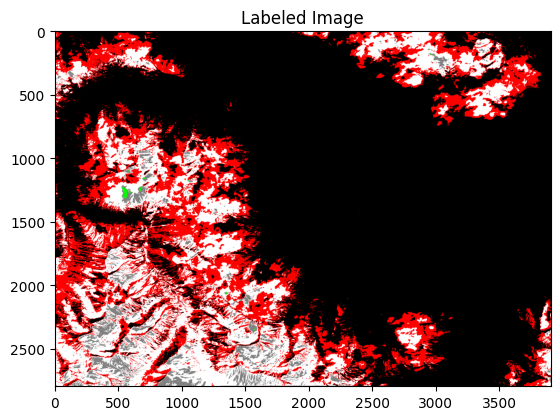

In [29]:
def segment_image(stacked_image_path):
    """
    Segment the stacked image into different classes and display the labeled image.

    Parameters:
    - stacked_image_path (str): The file path of the stacked image.

    Returns:
    - None
    """
    # Load the stacked image
    stacked_image = cv2.imread(stacked_image_path, cv2.IMREAD_GRAYSCALE)

    # Define pixel value ranges for each class
    water_range = (80, 120)
    snow_range = (120, 180)
    cloud_range = (180, 220)
    debris_range = (220, 255)

    # Create masks for each class
    water_mask = cv2.inRange(stacked_image, *water_range)
    snow_mask = cv2.inRange(stacked_image, *snow_range)
    cloud_mask = cv2.inRange(stacked_image, *cloud_range)
    debris_mask = cv2.inRange(stacked_image, *debris_range)

    # Create a labeled image with different colors for each class
    labeled_image = np.zeros((stacked_image.shape[0], stacked_image.shape[1], 3), dtype=np.uint8)

    # Assign colors based on masks
    labeled_image[water_mask == 255] = [0, 0, 255]  # Blue for water
    labeled_image[snow_mask == 255] = [255, 255, 255]  # White for snow
    labeled_image[cloud_mask == 255] = [128, 128, 128]  # Gray for cloud
    labeled_image[debris_mask == 255] = [0, 255, 0]  # Green for debris

    # Display the labeled image
    plt.imshow(cv2.cvtColor(labeled_image, cv2.COLOR_BGR2RGB))
    plt.title('Labeled Image')
    plt.show()

# Specify the file path of the stacked image
stacked_image_path = '/content/drive/MyDrive/SentinalTwoImage/stacked_image.png'

# Segment the image and display the result
segment_image(stacked_image_path)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


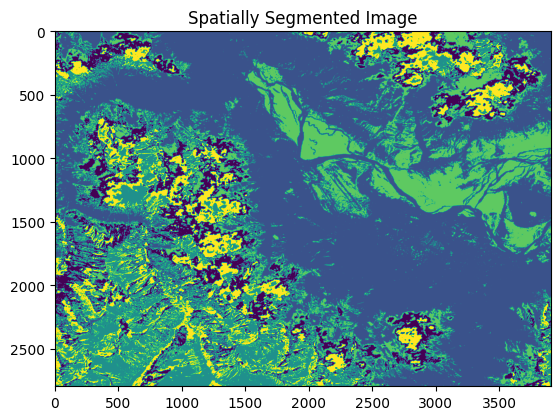

In [31]:

def spatial_segmentation(image_path, num_clusters=5):
    """
    Apply K-Means clustering for spatial segmentation and visualize the segmented image.

    Parameters:
    - image_path (str): The file path of the input image.
    - num_clusters (int): The number of clusters to use in K-Means clustering.

    Returns:
    - None
    """
    # Load the stacked image
    stacked_image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Reshape the image to a 2D array of pixels
    pixels = stacked_image.reshape((-1, 3))

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(pixels)

    # Assign labels to each pixel
    segmented_image = kmeans.labels_.reshape(stacked_image.shape[:2])

    # Visualize the segmented image
    plt.imshow(segmented_image, cmap='viridis')  # Adjust the colormap as needed
    plt.title('Spatially Segmented Image')
    plt.show()

# Specify the file path of the stacked image
image_path = '/content/drive/MyDrive/SentinalTwoImage/stacked_image.png'

# Number of clusters to use in K-Means clustering
num_clusters = 5  # Adjust based on your classes or desired segmentation

# Apply spatial segmentation and visualize the result
spatial_segmentation(image_path, num_clusters)


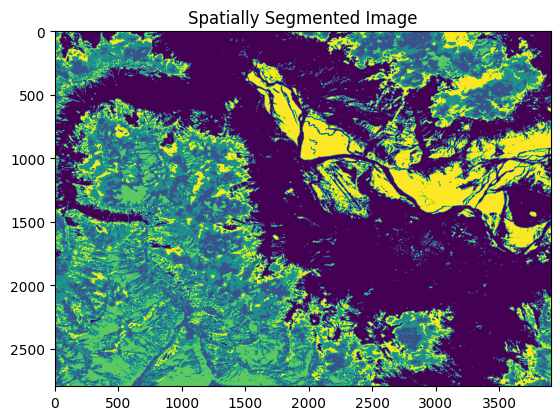

In [32]:
def spatial_segmentation(image_path, num_clusters=5, n_init=10, colormap='viridis'):
    """
    Perform spatial segmentation using K-Means clustering on a stacked image.

    Parameters:
    - image_path (str): Path to the stacked image.
    - num_clusters (int): Number of clusters for K-Means clustering.
    - n_init (int): Number of times K-Means will be run with different centroid seeds.
    - colormap (str): Colormap for visualizing the segmented image.

    Returns:
    - segmented_image (ndarray): Segmented image with assigned labels.
    """

    # Load the stacked image
    stacked_image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Reshape the image to a 2D array of pixels
    pixels = stacked_image.reshape((-1, 3))

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=num_clusters, n_init=n_init)
    kmeans.fit(pixels)

    # Assign labels to each pixel
    segmented_image = kmeans.labels_.reshape(stacked_image.shape[:2])

    # Visualize the segmented image
    plt.imshow(segmented_image, cmap=colormap)
    plt.title('Spatially Segmented Image')
    plt.show()

    return segmented_image

# Example Usage:
image_path = '/content/drive/MyDrive/SentinalTwoImage/stacked_image.png'
segmented_image_result = spatial_segmentation(image_path, num_clusters=5, n_init=10, colormap='viridis')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


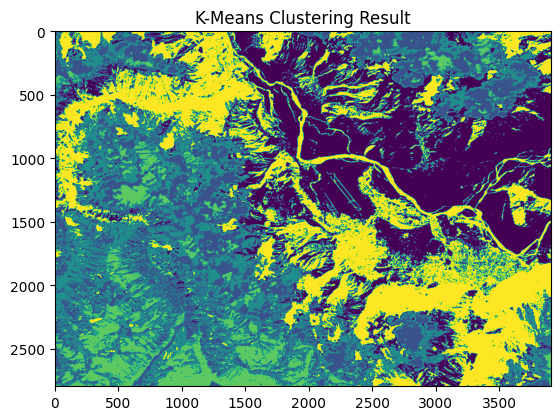

In [33]:
import rasterio
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def perform_kmeans_clustering(image_path, n_clusters=5, colormap='viridis'):
    """
    Perform K-Means clustering on a multispectral image.

    Parameters:
    - image_path (str): Path to the multispectral image.
    - n_clusters (int): Number of clusters for K-Means clustering.
    - colormap (str): Colormap for visualizing the clustered image.

    Returns:
    - clustered_image (ndarray): Resulting clustered image with assigned labels.
    """

    # Open the multispectral image
    src = rasterio.open(image_path)

    try:
        # Read the multispectral bands
        bands = src.read()

        # Reshape the data for clustering
        reshaped_data = bands.transpose(1, 2, 0).reshape(-1, bands.shape[0])

        # Perform K-Means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(reshaped_data)

        # Reshape the labels back to the original image shape
        clustered_image = labels.reshape(bands.shape[1], bands.shape[2])

        # Display the clustered image
        plt.imshow(clustered_image, cmap=colormap)
        plt.title('K-Means Clustering Result')
        plt.show()

        return clustered_image

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Example Usage:
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
clustered_image_result = perform_kmeans_clustering(image_path, n_clusters=5, colormap='viridis')


In [34]:
  def open_and_read_image(image_path):
    """
    Open and read a Sentinel-2 image using rasterio.

    Parameters:
    - image_path (str): The path to the Sentinel-2 image.

    Returns:
    - image_data (numpy.ndarray): The image data as a numpy array.
    - band_arrays (list): List of individual band arrays.
    """

    # Open the image using rasterio
    with rasterio.open(image_path) as src:
        # Read the image data as a numpy array
        image_data = src.read()

    # Check the shape of the array (should be (num_bands, height, width))
    print("Shape of the image data array:", image_data.shape)

    # Separate the bands
    band_arrays = [image_data[band, :, :] for band in range(image_data.shape[0])]

    # Convert the list of arrays to numpy arrays
    band_arrays = np.array(band_arrays)

    # Check the shape of one of the band arrays
    print("Shape of one band array:", band_arrays[0].shape)

    return image_data, band_arrays

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open and read the image
image_data, band_arrays = open_and_read_image(image_path)


Shape of the image data array: (13, 2797, 3909)
Shape of one band array: (2797, 3909)


In [35]:
import numpy as np
import rasterio

def display_image_info(image_path, points_to_display):
    """
    Open a Sentinel-2 image using rasterio and display information.

    Parameters:
    - image_path (str): The path to the Sentinel-2 image.
    - points_to_display (list of tuples): List of (row, column) points to display pixel values.

    Returns:
    - image_data (numpy.ndarray): The image data as a numpy array.
    """

    # Open the image file using rasterio
    with rasterio.open(image_path) as src:
        # Read the image data
        image_data = src.read()

    # Display the total number of pixels in the image
    total_pixels = np.prod(image_data.shape[1:])
    print("Total number of pixels in the image:", total_pixels)

    # Iterate through each band and display pixel values for specific points
    for band_index in range(image_data.shape[0]):
        print(f"\nPixel values for band {band_index + 1}:")
        for point in points_to_display:
            pixel_value = image_data[band_index, point[0], point[1]]
            print(f"Band {band_index + 1} - Point {point}: {pixel_value}")

    return image_data

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Define points to display pixel values
points_to_display = [(1, 2), (3, 4), (1000, 2000)]  # Add more points as needed

# Open the image and display information
image_data = display_image_info(image_path, points_to_display)


Total number of pixels in the image: 10933473

Pixel values for band 1:
Band 1 - Point (1, 2): 0
Band 1 - Point (3, 4): 5065
Band 1 - Point (1000, 2000): 3948

Pixel values for band 2:
Band 2 - Point (1, 2): 0
Band 2 - Point (3, 4): 3813
Band 2 - Point (1000, 2000): 3989

Pixel values for band 3:
Band 3 - Point (1, 2): 0
Band 3 - Point (3, 4): 3715
Band 3 - Point (1000, 2000): 4034

Pixel values for band 4:
Band 4 - Point (1, 2): 0
Band 4 - Point (3, 4): 3856
Band 4 - Point (1000, 2000): 4280

Pixel values for band 5:
Band 5 - Point (1, 2): 0
Band 5 - Point (3, 4): 4590
Band 5 - Point (1000, 2000): 4323

Pixel values for band 6:
Band 6 - Point (1, 2): 0
Band 6 - Point (3, 4): 4745
Band 6 - Point (1000, 2000): 4386

Pixel values for band 7:
Band 7 - Point (1, 2): 0
Band 7 - Point (3, 4): 4837
Band 7 - Point (1000, 2000): 4472

Pixel values for band 8:
Band 8 - Point (1, 2): 0
Band 8 - Point (3, 4): 4053
Band 8 - Point (1000, 2000): 4381

Pixel values for band 9:
Band 9 - Point (1, 2): 0

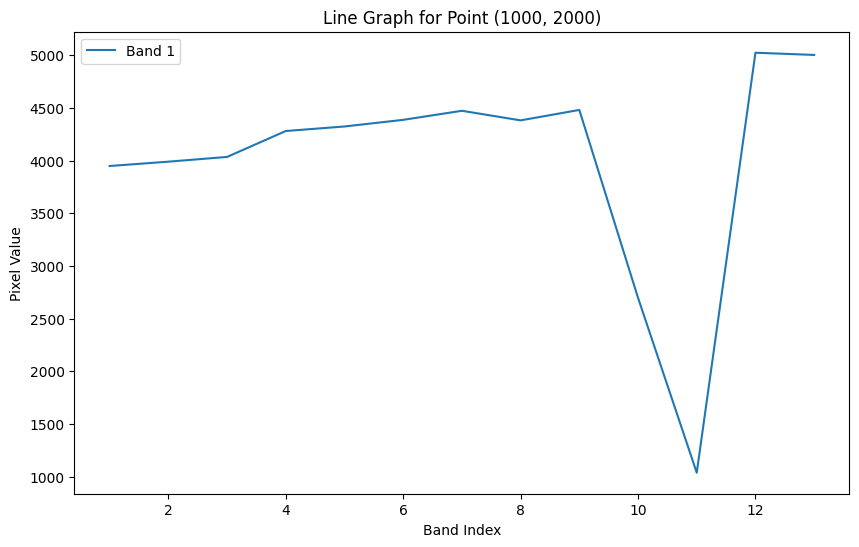

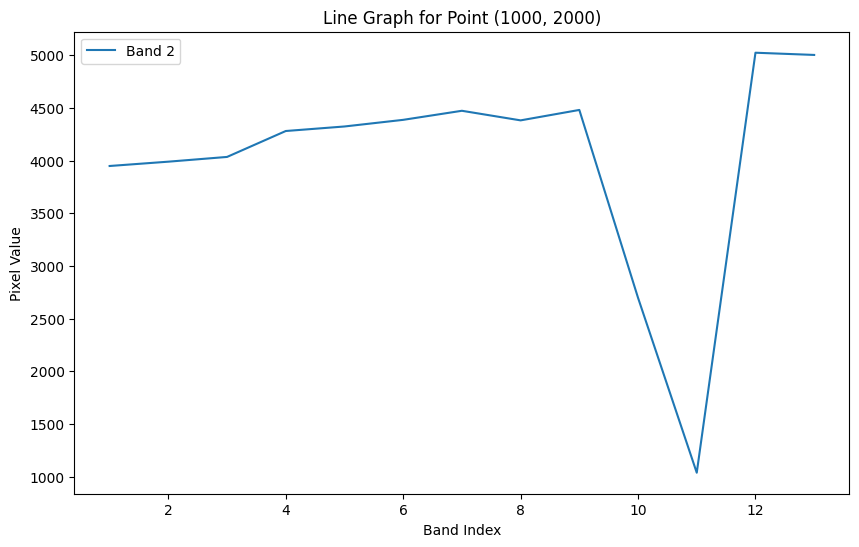

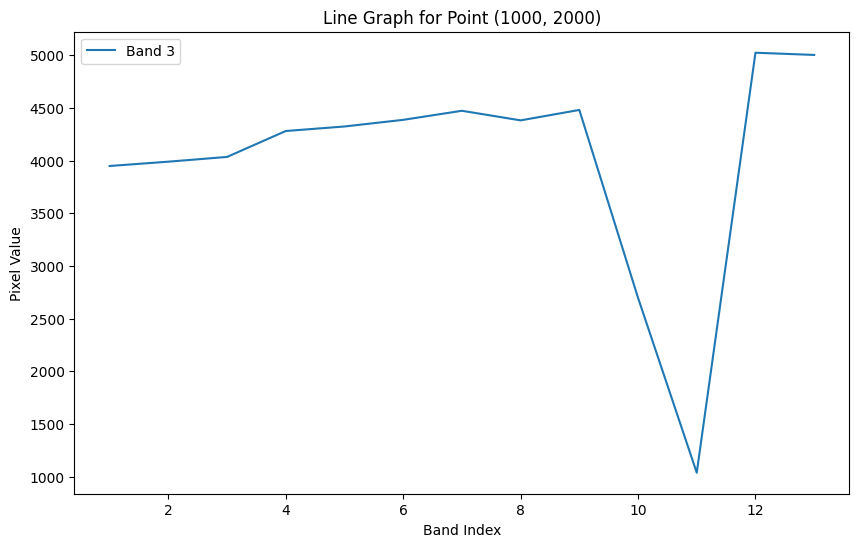

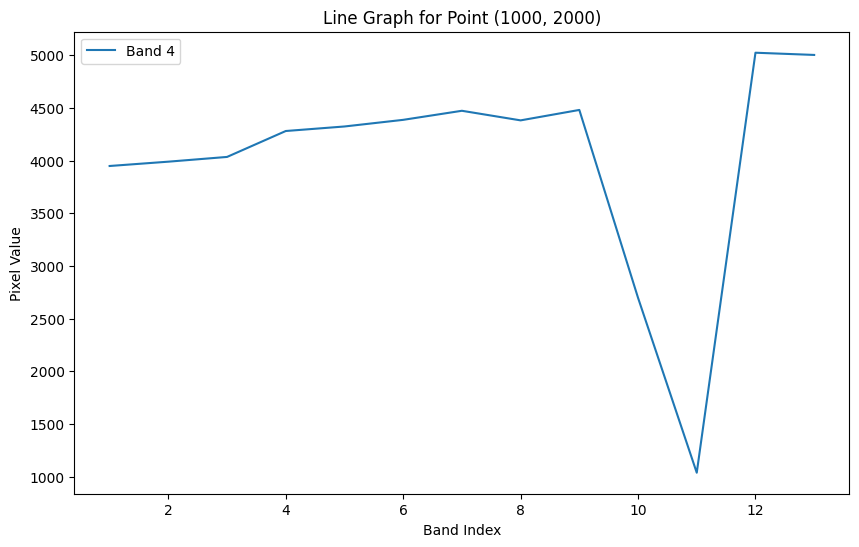

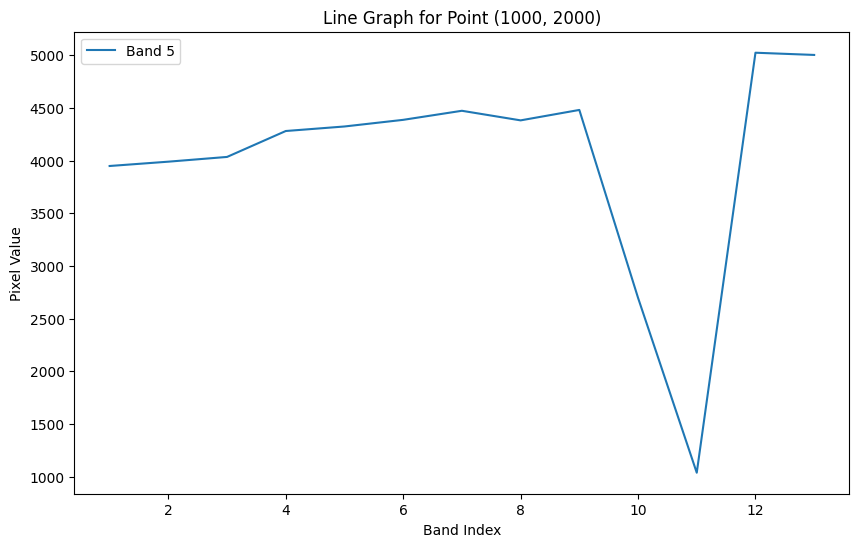

...

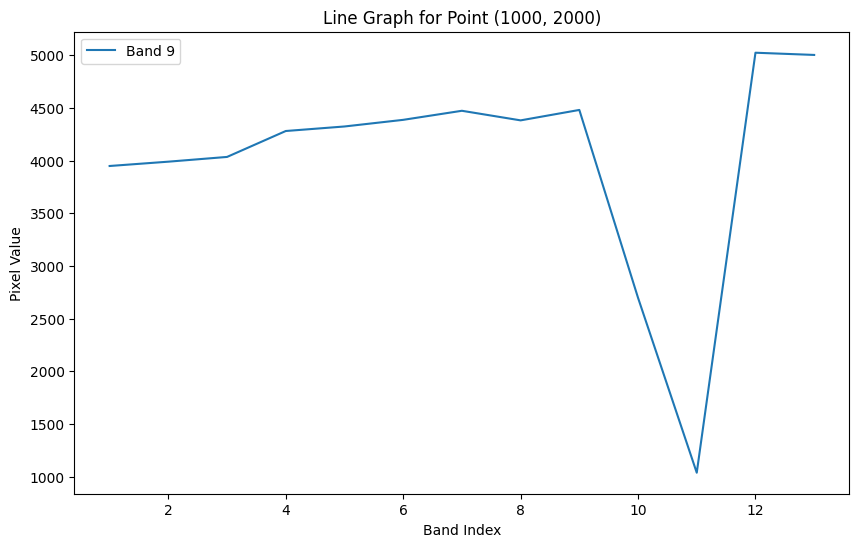

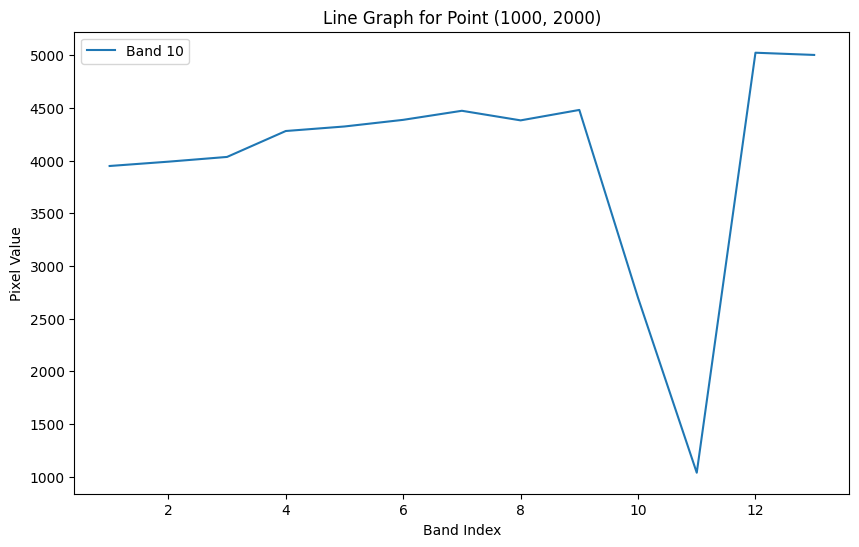

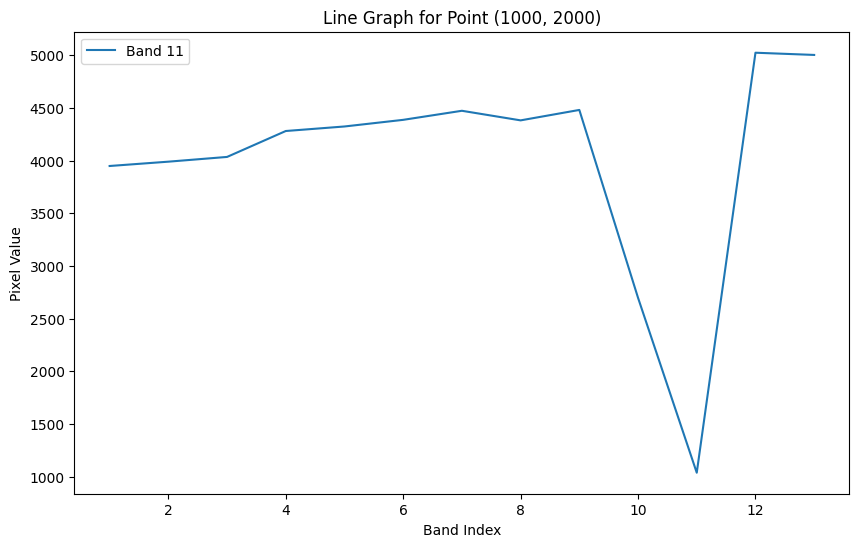

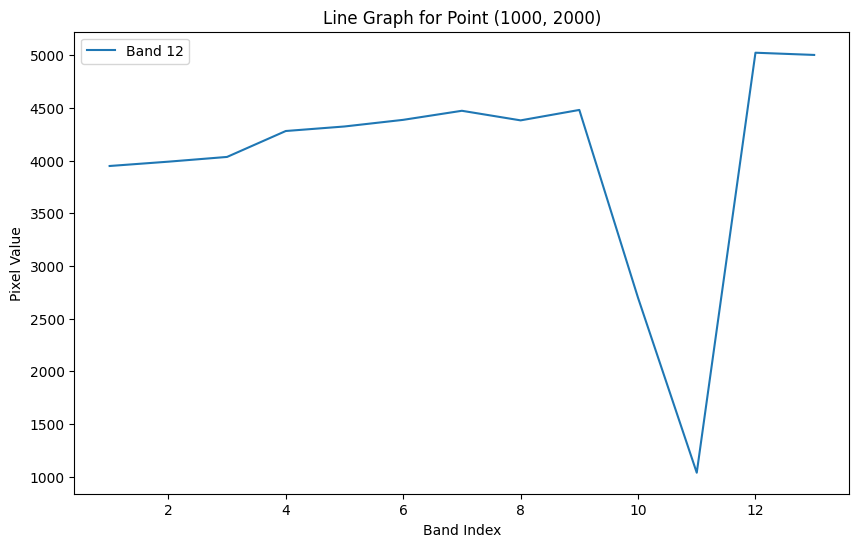

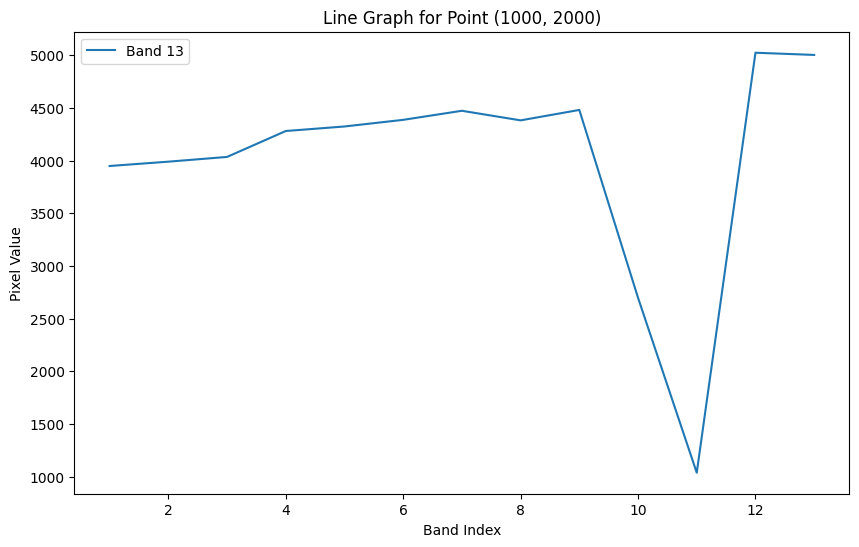

In [36]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Function to plot line graph for a specific band and point
def plot_line_graph(band_index, point, save_path=None):
    plt.figure(figsize=(10, 6))

    # Get pixel values for each band at the specified point
    pixel_values = image_data[:, point[0], point[1]]

    # Ensure that the point coordinates are within the valid range
    if point[0] < image_data.shape[1] and point[1] < image_data.shape[2]:
        # Check if pixel_values is 1-dimensional or 2-dimensional
        if len(pixel_values.shape) == 1:
            x_values = np.arange(1, len(pixel_values) + 1)
            y_values = pixel_values
        else:
            x_values = np.arange(1, pixel_values.shape[1] + 1)
            y_values = pixel_values[band_index, :]

        # Plot the line graph for the specified band and point
        plt.plot(x_values, y_values, label=f'Band {band_index + 1}')
        plt.title(f'Line Graph for Point {point}')
        plt.xlabel('Band Index')
        plt.ylabel('Pixel Value')
        plt.legend()

        # Save the plot to a file if a save_path is provided
        if save_path:
            plt.savefig(save_path)
        else:
            plt.show()
    else:
        print(f"Error: The specified point {point} is out of image range.")

# Specify the point for the line chart (you can change this)
point_to_display = (1000, 2000)

# Specify the path to save the line graphs
save_path_template = '/content/drive/MyDrive/SentinalTwoImage/LineGraph_Band_{band}_Point_{point}.png'

# Plot the line graph for the specified point for each band and save to a file
for band_to_display in range(image_data.shape[0]):
    save_path = save_path_template.format(band=band_to_display + 1, point=point_to_display)
    plot_line_graph(band_to_display, point_to_display, save_path=save_path)


(1000, 2000)


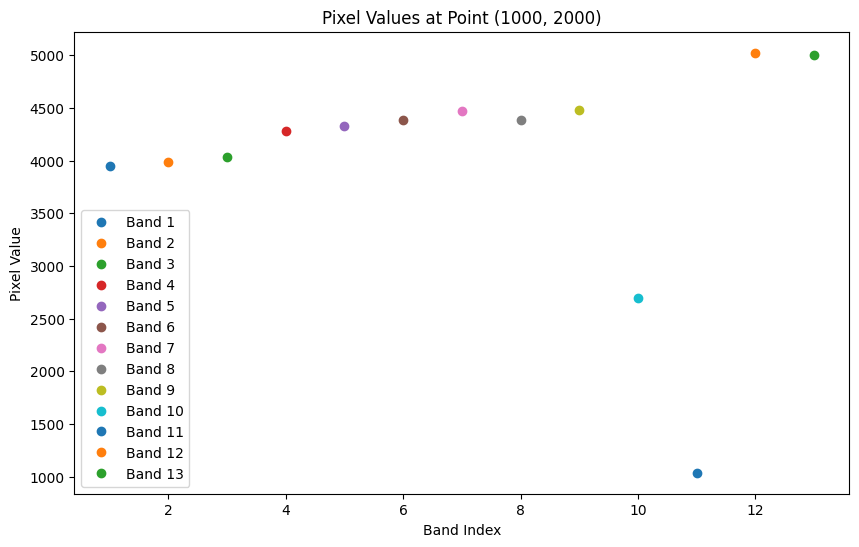

In [37]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Function to plot line graph for a specific point and save to a file
def plot_and_save_line_graph(point, save_path=None):
    plt.figure(figsize=(10, 6))

    # Iterate through bands
    for band_index in range(image_data.shape[0]):
        # Get the pixel value at the specified point
        pixel_value = image_data[band_index, point[0], point[1]]

        # Plot the pixel value for each band
        plt.plot(band_index + 1, pixel_value, 'o', label=f'Band {band_index + 1}')

    # Set labels and legend
    plt.title(f'Pixel Values at Point {point}')
    plt.xlabel('Band Index')
    plt.ylabel('Pixel Value')
    plt.legend()

    # Show or save the plot based on the presence of a save_path
    if save_path:
        plt.savefig(save_path)
    else:
        plt.show()

# Specify the point for the line chart (you can change this)
point_to_display = (1000, 2000)

# Specify the path to save the line graph
save_path = '/content/drive/MyDrive/SentinalTwoImage/LineGraph_Point_{point}.png'.format(point=point_to_display)

# Plot the line graph for the specified point and save to a file
plot_and_save_line_graph(point_to_display, save_path=save_path)

# Print the specified point
print(point_to_display)


In [38]:
def extract_pixel_values(image_path, point):
    """
    Extract pixel values at a specified point for each band in a Sentinel-2 image.

    Parameters:
    - image_path (str): The path to the Sentinel-2 image.
    - point (tuple): The (row, column) coordinates of the point to extract pixel values.

    Returns:
    - pixel_values_by_band (list): A list of pixel values for each band at the specified point.
    """

    # Open the image file using rasterio
    with rasterio.open(image_path) as src:
        # Read the image data
        image_data = src.read()

    # Initialize a list to store pixel values for each band
    pixel_values_by_band = []

    # Iterate through bands
    for band_index in range(image_data.shape[0]):
        # Get the pixel value at the specified point for the current band
        pixel_value = image_data[band_index, point[0], point[1]]
        pixel_values_by_band.append(pixel_value)

    return pixel_values_by_band

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Specify the point for which you want to extract pixel values
point_to_display = (1000, 2000)

# Extract pixel values for the specified point
pixel_values_by_band = extract_pixel_values(image_path, point_to_display)

# Print the pixel values for each band at the specified point
for band_index, pixel_value in enumerate(pixel_values_by_band):
    print(f"Band {band_index + 1} - Pixel Value: {pixel_value}")


Band 1 - Pixel Value: 3948
Band 2 - Pixel Value: 3989
Band 3 - Pixel Value: 4034
Band 4 - Pixel Value: 4280
Band 5 - Pixel Value: 4323
Band 6 - Pixel Value: 4386
Band 7 - Pixel Value: 4472
Band 8 - Pixel Value: 4381
Band 9 - Pixel Value: 4480
Band 10 - Pixel Value: 2697
Band 11 - Pixel Value: 1037
Band 12 - Pixel Value: 5023
Band 13 - Pixel Value: 5002


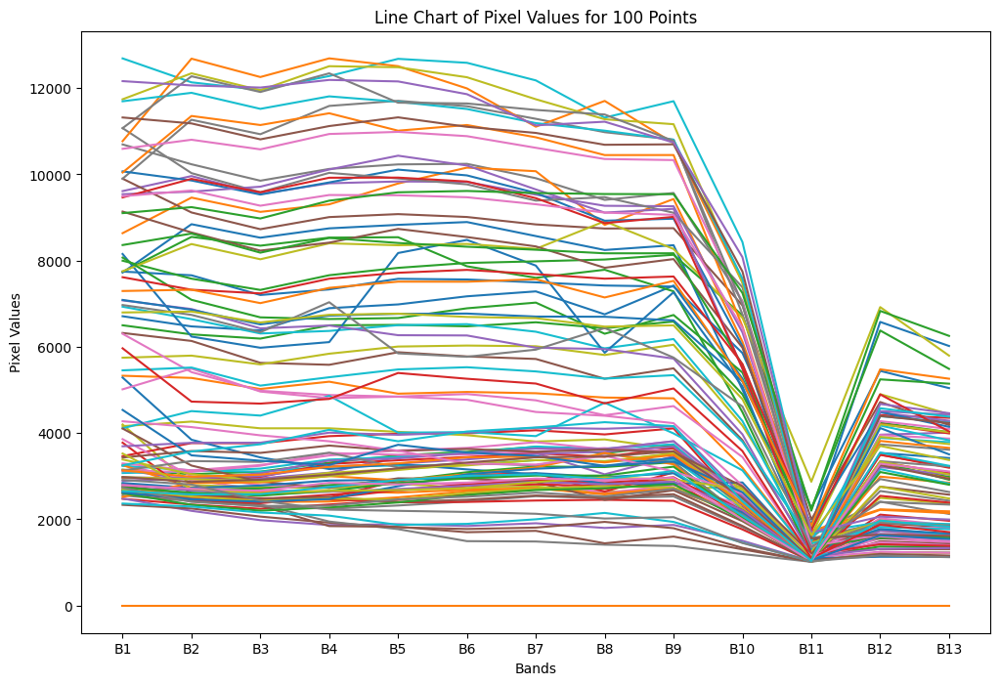

In [44]:
def extract_pixel_values_at_points(image_data, points):
    """
    Extract pixel values at specified points for each band in a Sentinel-2 image.

    Parameters:
    - image_data (numpy.ndarray): The image data as a numpy array.
    - points (numpy.ndarray): An array of (row, column) coordinates for points.

    Returns:
    - pixel_values_by_point (numpy.ndarray): An array of pixel values for each point and each band.
    """

    # Initialize a list to store pixel values for each point and each band
    pixel_values_by_point = []

    # Iterate through points
    for point in points:
        pixel_values_by_band = []

        # Iterate through bands
        for band_index in range(image_data.shape[0]):
            # Get the pixel value at the current point for the current band
            pixel_value = image_data[band_index, point[0], point[1]]
            pixel_values_by_band.append(pixel_value)

        pixel_values_by_point.append(pixel_values_by_band)

    # Convert the list to a NumPy array for easy indexing
    return np.array(pixel_values_by_point)

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Generate 100 random points for demonstration
np.random.seed(42)  # For reproducibility
points_to_display = np.random.randint(0, min(image_data.shape[1], image_data.shape[2]), size=(100, 2))

# Extract pixel values for the specified points
pixel_values_by_point = extract_pixel_values_at_points(image_data, points_to_display)

# Plot the line chart
plt.figure(figsize=(12, 8))

for i in range(pixel_values_by_point.shape[0]):
    plt.plot(range(1, image_data.shape[0] + 1), pixel_values_by_point[i, :], label=f'P{i + 1}')

plt.xticks(range(1, image_data.shape[0] + 1), [f'B{i}' for i in range(1, image_data.shape[0] + 1)])
plt.title('Line Chart of Pixel Values for 100 Points')
plt.xlabel('Bands')
plt.ylabel('Pixel Values')
#plt.legend(loc='upper right')
plt.show()


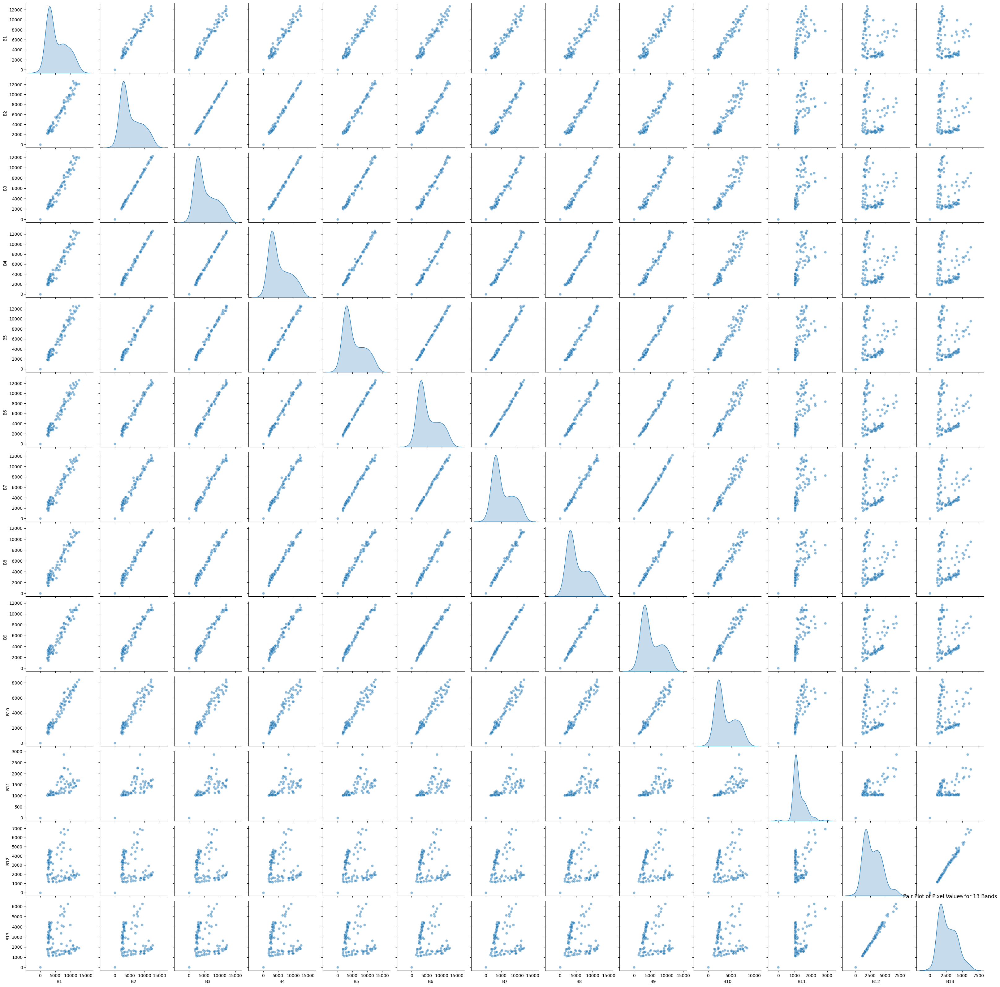

In [42]:
def plot_pair_plot(pixel_values_by_point, band_names):
    """
    Create a pair plot of pixel values for specified bands and points using Seaborn.

    Parameters:
    - pixel_values_by_point (numpy.ndarray): An array of pixel values for each point and each band.
    - band_names (list): A list of band names corresponding to the pixel values.

    Returns:
    - None
    """

    # Convert the pixel values to a DataFrame for Seaborn
    df = pd.DataFrame(pixel_values_by_point[:, :len(band_names)], columns=band_names)

    # Create a pair plot without the legend and individual points
    sns.pairplot(df, markers='o', diag_kind='kde', plot_kws={'alpha': 0.5})
    plt.title(f'Pair Plot of Pixel Values for {len(band_names)} Bands')
    plt.show()

# Define the band names
band_names = [f'B{i}' for i in range(1, image_data.shape[0] + 1)]

# Use the function to create a pair plot
plot_pair_plot(pixel_values_by_point, band_names)


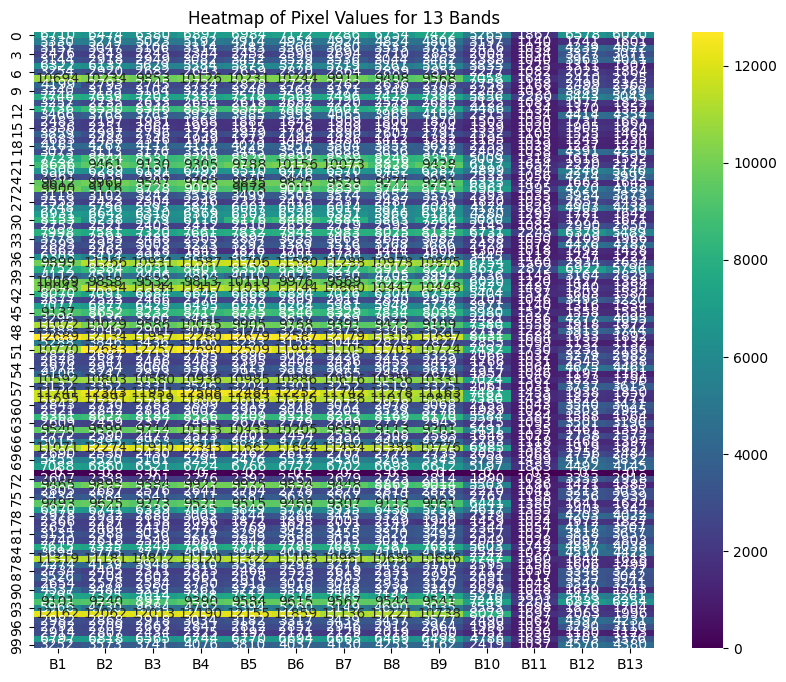

In [43]:
def plot_heatmap(pixel_values_by_point, band_names):
    """
    Create a heatmap of pixel values for specified bands and points using Seaborn.

    Parameters:
    - pixel_values_by_point (numpy.ndarray): An array of pixel values for each point and each band.
    - band_names (list): A list of band names corresponding to the pixel values.

    Returns:
    - None
    """

    # Convert the pixel values to a DataFrame for Seaborn
    df = pd.DataFrame(pixel_values_by_point[:, :len(band_names)], columns=band_names)

    # Create a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(df, cmap='viridis', annot=True, fmt='g')
    plt.title(f'Heatmap of Pixel Values for {len(band_names)} Bands')
    plt.show()

# Use the function to create a heatmap
plot_heatmap(pixel_values_by_point, band_names)


In [46]:
# Normalize the image data
normalized_image_data = image_data / image_data.max()

"""
Normalize the Sentinel-2 image data.

Parameters:
- image_data (numpy.ndarray): The original image data as a numpy array.

Returns:
- normalized_image_data (numpy.ndarray): The normalized image data, where pixel values are scaled to the range [0, 1].
"""


'\nNormalize the Sentinel-2 image data.\n\nParameters:\n- image_data (numpy.ndarray): The original image data as a numpy array.\n\nReturns:\n- normalized_image_data (numpy.ndarray): The normalized image data, where pixel values are scaled to the range [0, 1].\n'

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


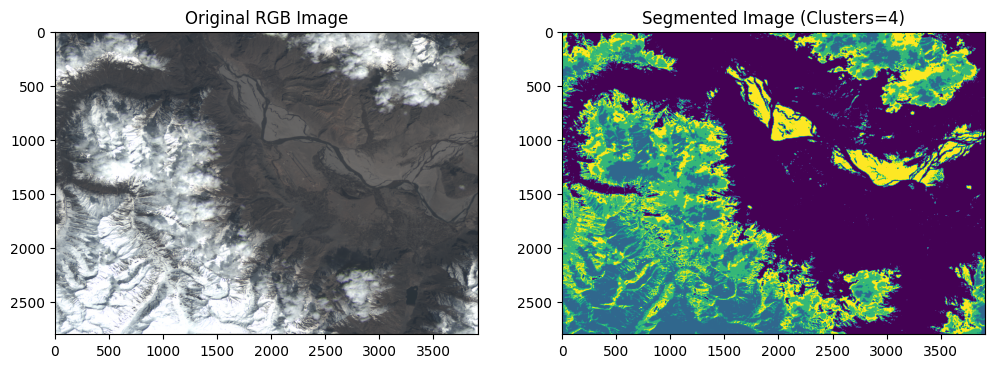

In [50]:
def apply_kmeans_clustering(rgb_image, num_clusters=5):
    """
    Apply K-Means clustering on a reshaped RGB image.

    Parameters:
    - rgb_image (numpy.ndarray): The normalized RGB image.
    - num_clusters (int): The number of clusters for K-Means clustering. Default is 4.

    Returns:
    - segmented_image (numpy.ndarray): The labels assigned to each pixel after K-Means clustering.
    """

    # Reshape the RGB image to a 2D array of pixels
    pixels = rgb_image.reshape((-1, 3))

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(pixels)

    # Assign labels to each pixel
    segmented_image = kmeans.labels_.reshape(rgb_image.shape[:2])

    return segmented_image

# Example usage:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the multispectral image
src = rasterio.open(image_path)

# Read the multispectral bands
bands = src.read()

# Choose specific bands for RGB visualization
rgb_bands = bands[[2, 1, 0], :, :]  # Assuming bands 3, 2, 1 for RGB visualization

# Normalize the data for displaying RGB image
rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

# Apply K-Means clustering
num_clusters = 4  # Adjust the number of clusters based on your classes
segmented_image = apply_kmeans_clustering(rgb_image, num_clusters)

# Display the result
plt.figure(figsize=(12, 6))

# Display RGB image
plt.subplot(1, 2, 1)
plt.imshow(rgb_image)
plt.title('Original RGB Image')

# Display Segmented Image
plt.subplot(1, 2, 2)
plt.imshow(segmented_image, cmap='viridis')
plt.title(f'Segmented Image (Clusters={num_clusters})')

# Save the Segmented Image
result_save_path = '/content/drive/MyDrive/SentinalTwoImage/segmented_image.png'
plt.savefig(result_save_path)

# Show the plots
plt.show()


In [51]:
# Example: Crop the image to the region of interest (ROI)
roi_start_row, roi_end_row = 100, 500
roi_start_col, roi_end_col = 200, 600
roi = rgb_image[roi_start_row:roi_end_row, roi_start_col:roi_end_col, :]

# Example: Divide the cropped image into patches (adjust the patch size as needed)
patch_size = 50
patches = [
    roi[i:i + patch_size, j:j + patch_size, :]
    for i in range(0, roi.shape[0], patch_size)
    for j in range(0, roi.shape[1], patch_size)
]


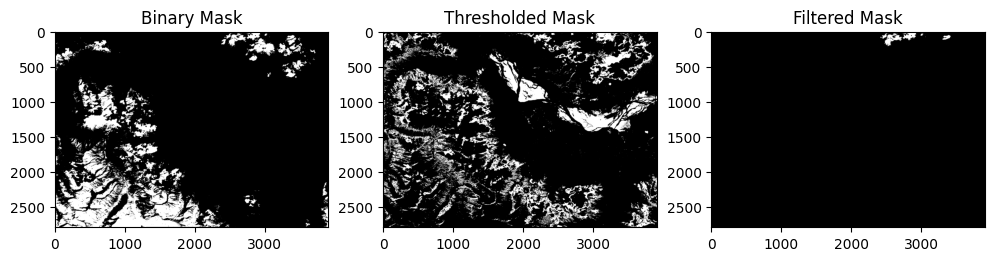

In [52]:
# Perform label processing based on your requirements
# This could include filtering, thresholding, or other techniques

# Example: Convert labels to binary mask (assuming you want to create a binary mask)
target_label = 1  # Adjust the label value based on your requirement
binary_mask = (segmented_image == target_label)

# Example: Apply additional processing if needed
# For instance, you can perform thresholding to create a binary mask
threshold_value = 2  # Adjust the threshold value based on your requirement
thresholded_mask = (segmented_image > threshold_value)

# Example: Apply a connectivity-based filter to remove small regions
# Requires importing the label function from scipy.ndimage
from scipy.ndimage import label

connected_components, num_labels = label(binary_mask)
min_region_size = 50  # Adjust the minimum region size based on your requirement

filtered_mask = (connected_components > 0) & (connected_components < min_region_size)

# Example: Visualize the processed masks
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(binary_mask, cmap='gray')
plt.title('Binary Mask')

plt.subplot(1, 3, 2)
plt.imshow(thresholded_mask, cmap='gray')
plt.title('Thresholded Mask')

plt.subplot(1, 3, 3)
plt.imshow(filtered_mask, cmap='gray')
plt.title('Filtered Mask')

plt.show()


In [53]:
# Generate a color code (hexadecimal)
color_code = '#3C1098'  # Example color code, adjust as needed


In [54]:
# Convert a hexadecimal color code to RGB
def hex_to_rgb(hex_color):
    """
    Convert a hexadecimal color code to RGB.

    Parameters:
    - hex_color (str): Hexadecimal color code.

    Returns:
    - rgb (tuple): RGB values as a tuple.
    """
    hex_color = hex_color.lstrip('#')  # Remove the '#' if present
    rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))  # Convert each pair of hex digits to decimal
    return rgb

# Example usage:
rgb_color = hex_to_rgb(color_code)
print("RGB Color:", rgb_color)


RGB Color: (60, 16, 152)


In [55]:
from sklearn.preprocessing import OneHotEncoder

# Reshape the labels for one-hot encoding
labels_reshaped = segmented_image.reshape(-1, 1)

# Apply one-hot encoding
encoder = OneHotEncoder(sparse=False)  # Creating a OneHotEncoder instance
one_hot_labels = encoder.fit_transform(labels_reshaped)  # Applying one-hot encoding


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.34 µs


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


CPU times: user 1min 47s, sys: 9.58 s, total: 1min 57s
Wall time: 1min 24s


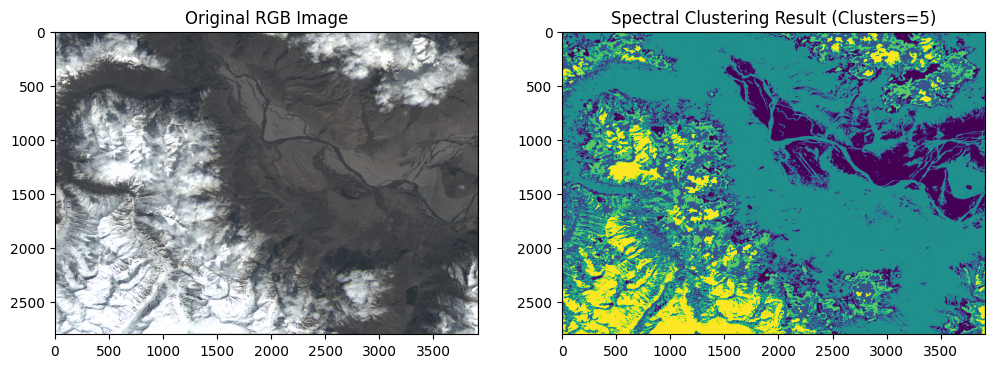

In [56]:
%time

def perform_spectral_clustering(image_path, num_clusters=5):
    """
    Apply spectral clustering on a Sentinel-2 multispectral image.

    Parameters:
    - image_path (str): The path to the Sentinel-2 image.
    - num_clusters (int): The number of clusters for K-Means clustering. Default is 5.

    Returns:
    - spectral_labels (numpy.ndarray): The labels assigned to each pixel after spectral clustering.
    """

    # Open the multispectral image
    src = rasterio.open(image_path)

    # Read the multispectral bands
    bands = src.read()

    # Choose specific bands for RGB visualization
    rgb_bands = bands[[2, 1, 0], :, :]  # Assuming bands 3, 2, 1 for RGB visualization

    # Normalize the data for displaying RGB image
    rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

    # Reshape the image to a 2D array of pixels
    pixels = rgb_image.reshape((-1, 3))

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=num_clusters)
    %time kmeans.fit(pixels)

    # Assign labels to each pixel
    spectral_labels = kmeans.labels_.reshape(rgb_image.shape[:2])

    return spectral_labels

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Specify the number of clusters for K-Means clustering (in this case, 5 clusters)
num_clusters = 5

# Perform spectral clustering
spectral_labels = perform_spectral_clustering(image_path, num_clusters)

# Display the result
plt.figure(figsize=(12, 6))

# Display RGB image
plt.subplot(1, 2, 1)
plt.imshow(rgb_image)
plt.title('Original RGB Image')

# Display Spectral Clustering Result
plt.subplot(1, 2, 2)
plt.imshow(spectral_labels, cmap='viridis')
plt.title(f'Spectral Clustering Result (Clusters={num_clusters})')

# Save the Spectral Clustering Result image
result_save_path = '/content/drive/MyDrive/SentinalTwoImage/spectral_clustering_result.png'
plt.savefig(result_save_path)

# Show the plots
plt.show()


CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 9.54 µs


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


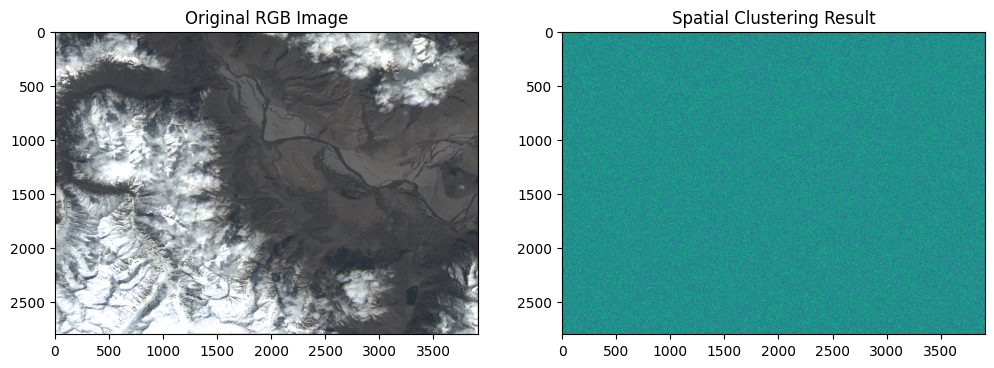

In [57]:
%time
from sklearn.preprocessing import OneHotEncoder
import numpy as np

# Example: Create a binary spatial mask (adjust as needed)
spatial_mask = np.random.choice([0, 1], size=(rgb_image.shape[0], rgb_image.shape[1]))

# Reshape the spatial mask for one-hot encoding
spatial_labels_reshaped = spatial_mask.reshape(-1, 1)

# Apply one-hot encoding
encoder = OneHotEncoder(sparse=False)
spatial_one_hot_labels = encoder.fit_transform(spatial_labels_reshaped)

# Reshape the spatial one-hot labels to match the shape of spectral labels
spatial_one_hot_labels = spatial_one_hot_labels.reshape(rgb_image.shape[:2] + (-1,))

# Display the result
plt.figure(figsize=(12, 6))

# Display RGB image
plt.subplot(1, 2, 1)
plt.imshow(rgb_image)
plt.title('Original RGB Image')

# Display Spatial Clustering Result
plt.subplot(1, 2, 2)
plt.imshow(spatial_mask, cmap='viridis')
plt.title('Spatial Clustering Result')

# Save the Spatial Clustering Result image
result_save_path = '/content/drive/MyDrive/SentinalTwoImage/spatial_clustering_result.png'
plt.savefig(result_save_path)

# Show the plots
plt.show()


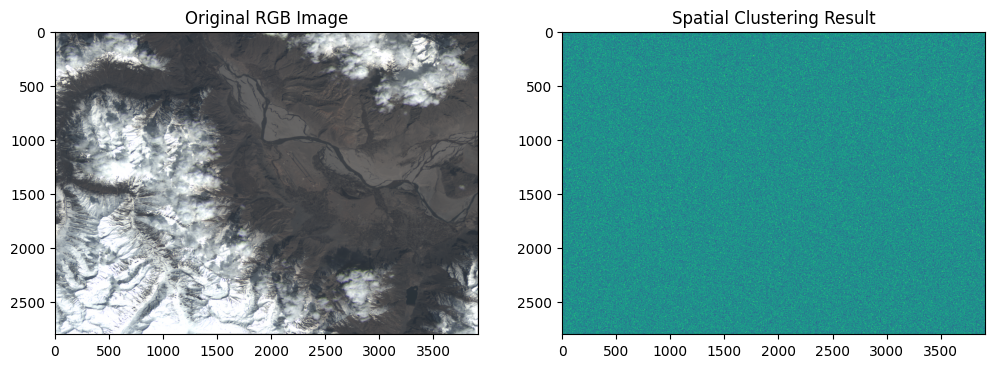

In [59]:
# Generate a binary spatial mask (example: random for demonstration)
spatial_mask = np.random.choice([0, 1], size=(rgb_image.shape[0], rgb_image.shape[1]))

# Display the result
plt.figure(figsize=(12, 6))

# Display RGB image
plt.subplot(1, 2, 1)
plt.imshow(rgb_image)
plt.title('Original RGB Image')

# Display Spatial Clustering Result (color-coded for better visualization)
plt.subplot(1, 2, 2)
plt.imshow(spatial_mask, cmap='viridis', vmin=0, vmax=1)  # Ensure binary visualization
plt.title('Spatial Clustering Result')

# Save the Spatial Clustering Result image
result_save_path = '/content/drive/MyDrive/SentinalTwoImage/spatial_clustering_result.png'
plt.savefig(result_save_path)

# Show the plots
plt.show()


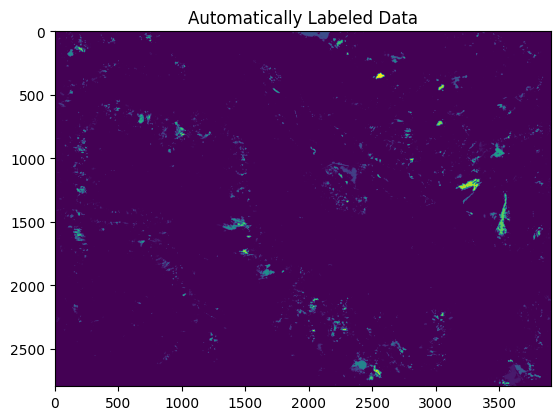

In [58]:
# Import necessary libraries
from scipy.ndimage import label, generate_binary_structure

# Combine the spatial and spectral labels
combined_labels = np.concatenate([spatial_one_hot_labels, spectral_labels.reshape(rgb_image.shape[:2] + (1,))], axis=2)

# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Perform majority voting to get the final labels
structure = generate_binary_structure(2, 2)  # Define a 3x3 neighborhood structure
labeled_data, _ = label(combined_labels[:, :, -1], structure=structure)

# Map the majority voted labels to the class labels
mapped_labels = np.zeros_like(labeled_data, dtype=np.uint8)

for i in range(1, labeled_data.max() + 1):
    class_count = np.sum(labeled_data == i, axis=0)
    majority_class = np.argmax(class_count)
    mapped_labels[labeled_data == i] = majority_class

# Visualize the labeled data
plt.imshow(mapped_labels, cmap='viridis')  # Adjust the colormap as needed
plt.title('Automatically Labeled Data')
plt.show()


In [ ]:
# Import necessary libraries
import rasterio
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.backend import set_image_data_format
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras import optimizers, losses, utils
from tensorflow.keras.utils import to_categorical
from scipy.ndimage import label, generate_binary_structure

# Load the 13-band image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Perform majority voting to get the final labels
structure = generate_binary_structure(3, 1)  # Corrected to have three dimensions
labeled_data, _ = label(image_data, structure=structure)

# Map the majority voted labels to the class labels
y = np.zeros_like(labeled_data, dtype=np.uint8)
for class_name, class_label in class_labels.items():
    class_mask = labeled_data == class_label
    y[class_mask] = class_label

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_data, y, test_size=0.2, random_state=42)

# Normalize the pixel values to the range [0, 1]
X_train = X_train / 10000.0
X_val = X_val / 10000.0

# Convert labels to one-hot encoding
y_train_one_hot = to_categorical(y_train)
y_val_one_hot = to_categorical(y_val)

# Reshape the training data to add a channel dimension
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], X_val.shape[2], 1)

# Define the CNN model
set_image_data_format('channels_last')  # Change to 'channels_last' if using TensorFlow 2.x
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=(X_train.shape[1], X_train.shape[2], 1)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(2, 2))
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(2, 2))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(len(np.unique(y))))
model.add(Activation('softmax'))  # Use softmax for multi-class classification

# Compile the model
adam = optimizers.Adam(lr=0.001)
model.compile(optimizer=adam, loss=losses.categorical_crossentropy, metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train_one_hot, validation_data=(X_val, y_val_one_hot), epochs=10, batch_size=32)

# ... (Visualization of training history if needed)

# Save the trained model if needed
model.save('/content/drive/MyDrive/SentinalTwoImage/semantic_segmentation_model.h5')